In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
sc.logging.print_versions()

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.7.6
scanpy      1.8.1
sinfo       0.3.4
-----
PIL                 8.3.1
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
cffi                1.14.6
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
decorator           5.0.9
defusedxml          0.7.1
entrypoints         0.3
h5py                3.4.0
ipykernel           6.2.0
ipython_genutils    0.2.0
jedi                0.18.0
joblib              1.0.1
kiwisolver          1.3.1
llvmlite       

# Integrate data

In [2]:
def read(path):
    foo = sc.read('Summary\\'+path+'\\qced_data.h5ad')
    foo.obs['batchn'] = path[-1:]
    foo.obs['sample'] = path
    foo.var_names_make_unique()
    foo.var=foo.var[['gene_ids','feature_types','genome']]
    return foo

In [3]:
paths=paths=['Tg_12m_1', 'Tg_12m_2', 'Tg_12m_3', 'Tg_12m_4', 'Tg_2m_1', 'Tg_2m_2', 'Tg_2m_3', 'Tg_2m_4', 'Tg_3m_1', 'Tg_3m_2', 'Tg_3m_3', 'Tg_3m_4', 'Tg_9m_1', 'Tg_9m_2', 'Tg_9m_3', 'Tg_9m_4']
adata=read(paths[0])
datas=[]
for path in paths[1:]:
    foo=read(path)
    datas.append(foo)
    

In [5]:
adata=adata.concatenate(datas)

In [6]:
adata

AnnData object with n_obs × n_vars = 61374 × 12801
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet', 'doublet_score', 'n_genes', 'batchn', 'sample', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

In [12]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4,size=0.1, multi_panel=True)

TypeError: calculate_qc_metrics() got an unexpected keyword argument 'log1p'

In [7]:
adata

AnnData object with n_obs × n_vars = 61374 × 12801
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet', 'doublet_score', 'n_genes', 'batchn', 'sample', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [8]:
sc.pp.filter_cells(adata,min_genes=0)
sc.pp.filter_genes(adata,min_cells=3)

In [9]:
adata

AnnData object with n_obs × n_vars = 61374 × 12801
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet', 'doublet_score', 'n_genes', 'batchn', 'sample', 'batch'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

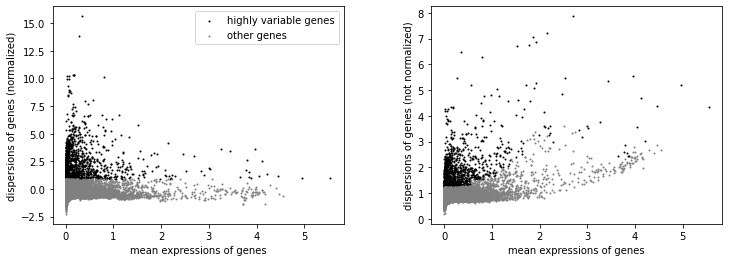

In [10]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.15, max_mean=5, min_disp=0.25,n_top_genes=1200)
sc.pl.highly_variable_genes(adata)

In [11]:
sc.pp.scale(adata,max_value=10)

In [12]:
cell_cycle_genes = [x.strip() for x in open('regev_lab_cell_cycle_genes.txt')]

In [13]:
for i in range(len(cell_cycle_genes)):
    cell_cycle_genes[i]=cell_cycle_genes[i][:1]+cell_cycle_genes[i][1:].lower()

In [14]:
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]

In [15]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


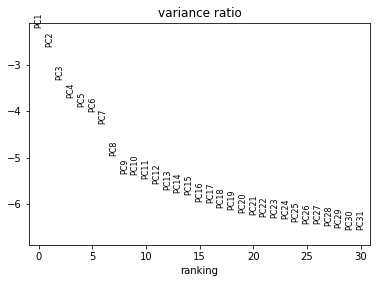

In [16]:
sc.tl.pca(adata, svd_solver='arpack',use_highly_variable=True)
sc.pl.pca_variance_ratio(adata, log=True)

In [17]:
#sc.pp.neighbors(adata, n_neighbors=25, n_pcs=25)

In [18]:
sc.external.pp.bbknn(adata,batch_key='sample')

In [19]:
sc.tl.umap(adata)
sc.tl.tsne(adata)

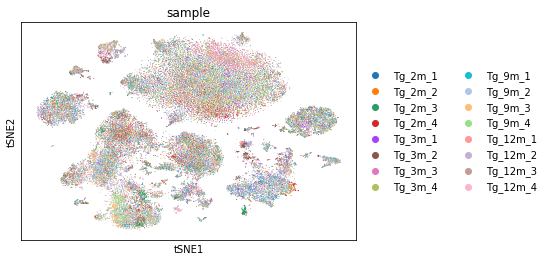

In [21]:
sc.pl.tsne(adata,color='sample')

In [22]:
adata.write('all_data_8_26.h5')

In [23]:
adata

AnnData object with n_obs × n_vars = 61374 × 12801
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet', 'doublet_score', 'n_genes', 'batchn', 'sample', 'batch', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'tsne', 'batchn_colors', 'sample_colors'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [24]:
marker_dict_s=[['Cd74', 'Cd79a', 'Ms4a1', 'Bank1'],
 ['Cd3d', 'Cd3g', 'Ly6c1', 'Lef1'],
 ['Ccl5', 'Cd8b1', 'Cd3d', 'Gzmk', 'Cd8a'],
 ['Cd3d', 'Cd8a', 'Cd8b1', 'Cd3g', 'Dapl1', 'Lef1', 'Il7r'],
 ['Cd14', 'Csf1r', 'Fcer1g', 'Ly6c2', 'S100a4'],
 ['Cd3g', 'Cd8b1', 'Cd3d', 'Cd8a', 'Ly6c2', 'Il7r'],
 ['Apoe', 'Csf1r', 'Cst3', 'Gngt2'],
 ['Cd79a', 'Cd74', 'Ms4a1', 'Cd79b'],
 ['Gzma', 'Klra4', 'Klra8', 'Nkg7', 'Klra7'],
 ['Cd79a', 'Ms4a1', 'Cd74', 'Ly6d', 'Vpreb3'],
 ['Apoe', 'Csf1r', 'Cst3', 'Gngt2', 'Chil3'],
 ['Cd3g', 'Cd3d', 'Cd3e', 'Cd4', 'Ikzf2'],
 ['Pf4', 'Nrgn', 'Ppbp', 'Ctla2a'],
 ['Cd74', 'Cd79a', 'Ms4a1', 'Bank1'],
 ['Cd79b', 'Cd74', 'Cd79a', 'Ms4a1', 'Bank1', 'Mzb1'],
 ['Ppbp', 'Pf4', 'Gng11', 'Tubb2a'],
 ['S100a9', 'S100a8', 'Ly6g', 'Lcn2', 'Retnlg', 'Il1b'],
 ['Cd3d', 'Cd3g', 'Tcf7', 'Lef1', 'Il7r'],
 ['Fcer1a', 'Cd200r3', 'Ms4a2'],
 ['Ppbp', 'Pf4', 'Gng11', 'Apoe'],
 ['Cd3d', 'Cd3g', 'Cd3e', 'Stmn1', 'Hmgb2'],
 ['Cd3d', 'Cd3g', 'Cd3e', 'Ifit3', 'Ifit1'],
 ['Cd79a', 'Cd74', 'Cd19', 'Ebf1'],
 ['Bst2', 'Irf8', 'Cd209a', 'H2-DMb1', 'Cst3'],
 ['Cd14', 'Csf1r', 'Fcer1g', 'Ly6c2', 'S100a4'],
 ['Csf1r', 'Ace', 'Gngt2', 'Cebpb', 'Apoe'],
 ['Klra4', 'Klra8', 'Nkg7', 'Klra7', 'Ncr1', 'Gzma'],
 ['Cd79a', 'Cd74', 'Ebf1', 'Cd19']]

cell_list_s=['B cell (H2-Aa High)',
 'T cell (Igfbp4 High)',
 'T cell (Ccl5 High)',
 'T cell (Dapl1 High)',
 'Monocyte (Chil3 High)',
 'T cell (Ly6c2 High)',
 'Macrophage (Apoe High)',
 'B cell ( H2-Eb1 High)',
 'NK cell (Gzma High)',
 'B cell (Ly6d High)',
 'Macrophage (Hbb-bs High )',
 'T cell (Ikzf2 High)',
 'Macrophage (pf4 high)',
 'B cell ( Ly6a High)',
 'B cell (Mzb1 High)',
 'Macrophage (ppbp High)',
 'Neutrophil',
 'T cell (Lef1 high)',
 'Basophil (Ccl3 High)',
 'Macrophage (Ifitm3 High)',
 'T cell (Stmn1 High)',
 'T cell (Ifit3 High)',
 'B cell (H2-Ab1 High)',
 'Dendritic cell',
 'Monocyte (Ifi204 High)',
 'Macrophage (Ace high)',
 'NK cell (Ncr1 High)',
 'B cell (Ebf1 High)']


resolutions== 0.2
resolutions== 0.4
resolutions== 0.6
resolutions== 0.8
resolutions== 1.0
resolutions== 1.2


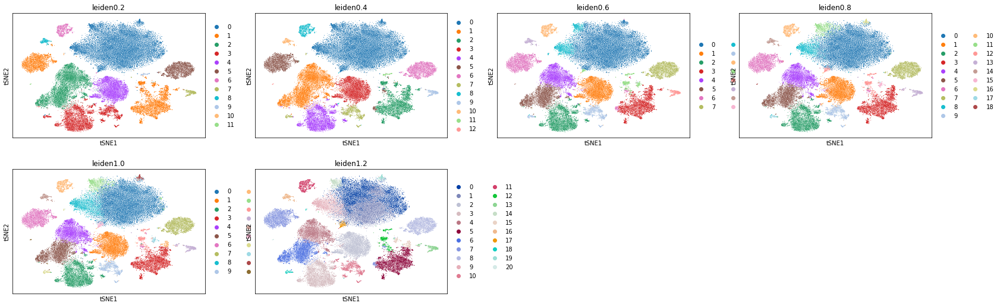

B cell (H2-Aa High)
--------------------------------------------------------------------------------------------------------------------


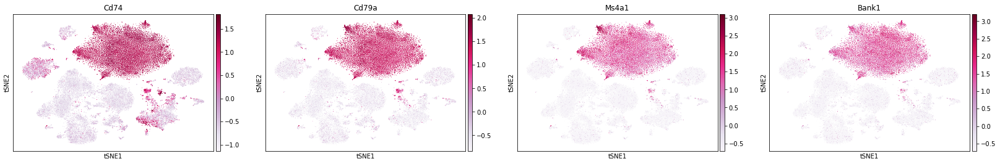

T cell (Igfbp4 High)
--------------------------------------------------------------------------------------------------------------------


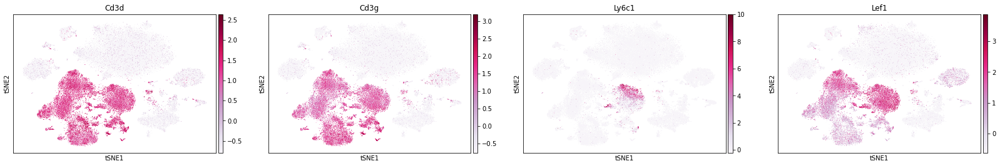

T cell (Ccl5 High)
--------------------------------------------------------------------------------------------------------------------


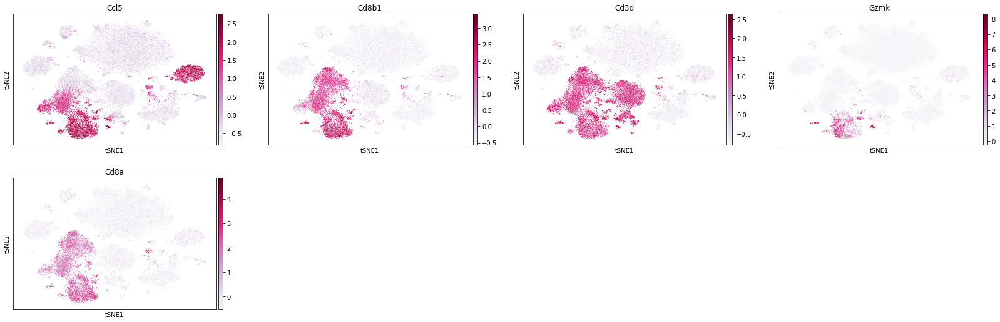

T cell (Dapl1 High)
--------------------------------------------------------------------------------------------------------------------


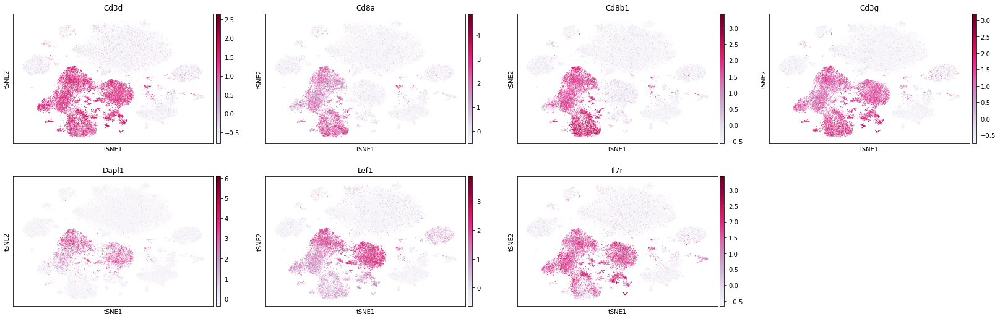

Monocyte (Chil3 High)
--------------------------------------------------------------------------------------------------------------------


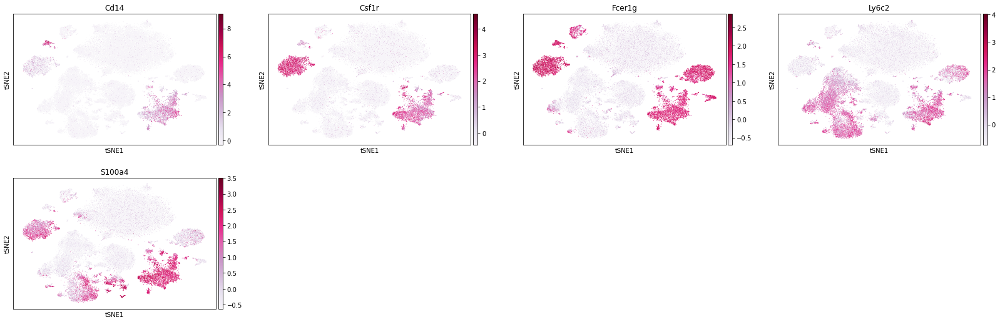

T cell (Ly6c2 High)
--------------------------------------------------------------------------------------------------------------------


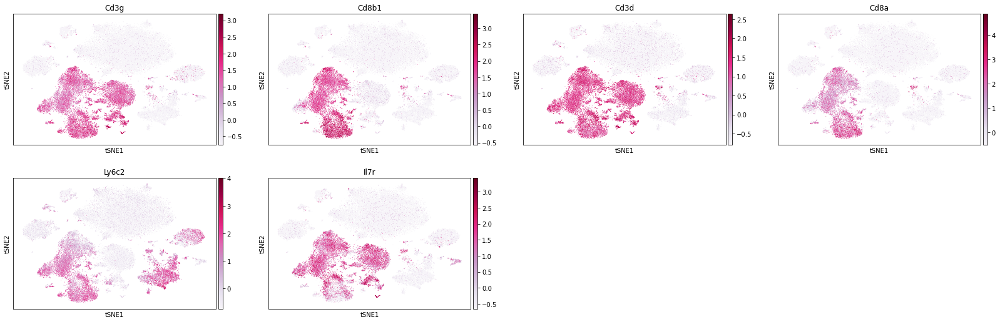

Macrophage (Apoe High)
--------------------------------------------------------------------------------------------------------------------


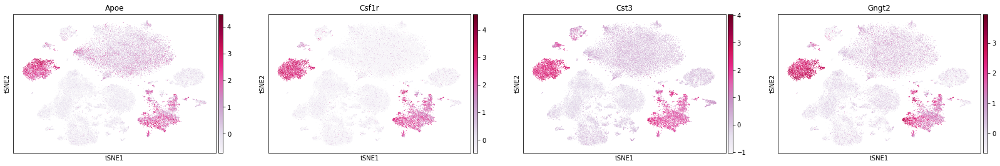

B cell ( H2-Eb1 High)
--------------------------------------------------------------------------------------------------------------------


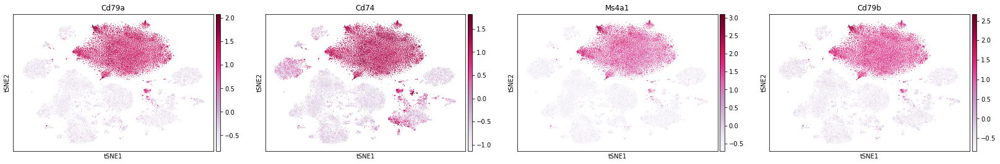

NK cell (Gzma High)
--------------------------------------------------------------------------------------------------------------------


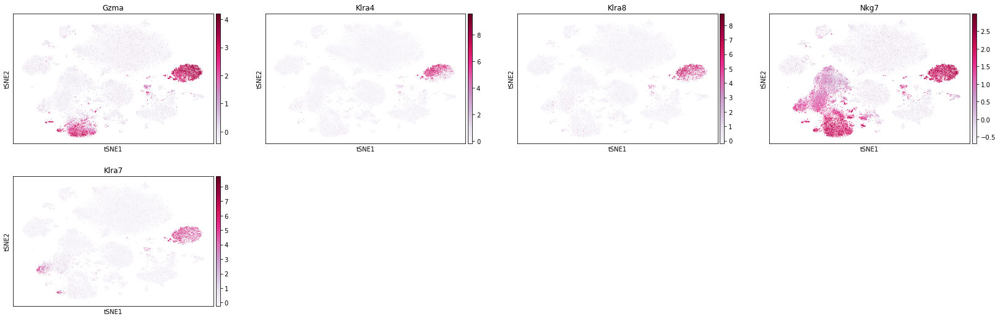

B cell (Ly6d High)
--------------------------------------------------------------------------------------------------------------------


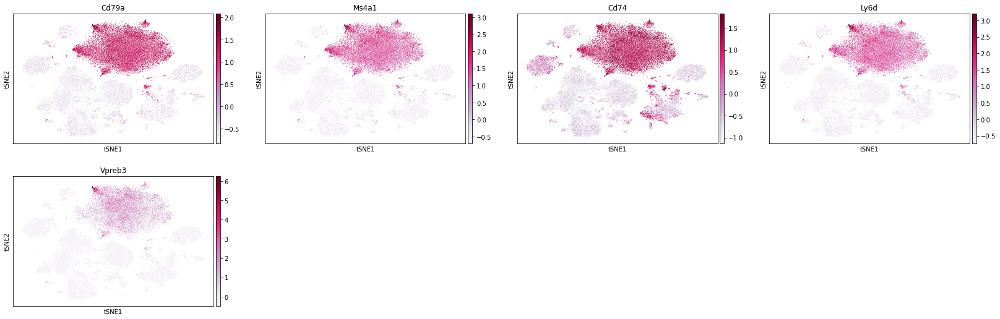

Macrophage (Hbb-bs High )
--------------------------------------------------------------------------------------------------------------------


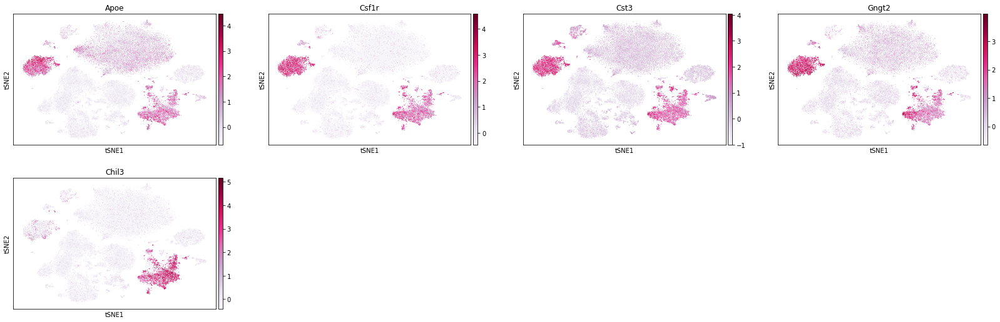

T cell (Ikzf2 High)
--------------------------------------------------------------------------------------------------------------------


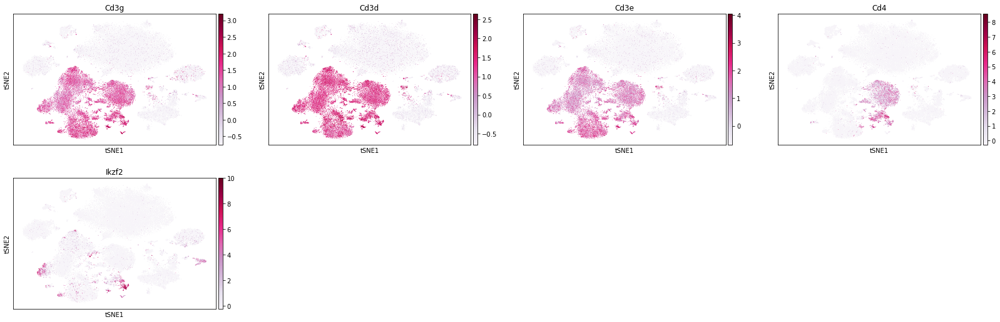

Macrophage (pf4 high)
--------------------------------------------------------------------------------------------------------------------


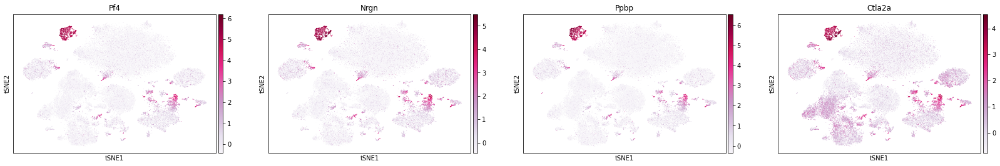

B cell ( Ly6a High)
--------------------------------------------------------------------------------------------------------------------


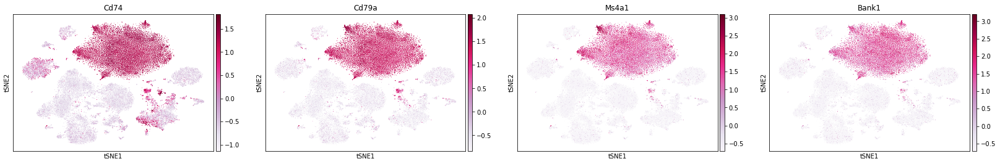

B cell (Mzb1 High)
--------------------------------------------------------------------------------------------------------------------


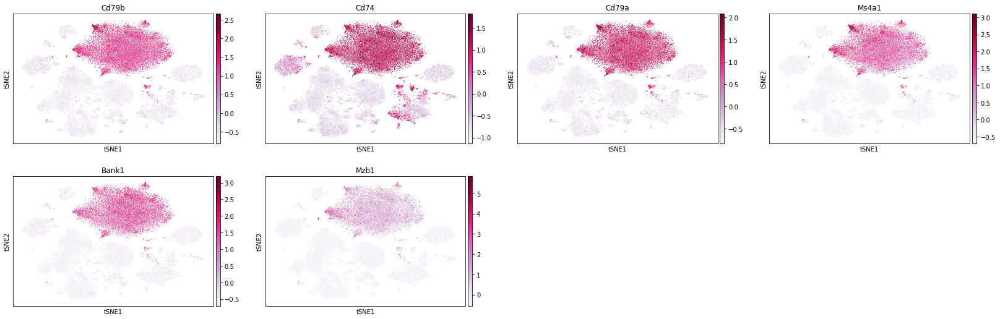

Macrophage (ppbp High)
--------------------------------------------------------------------------------------------------------------------


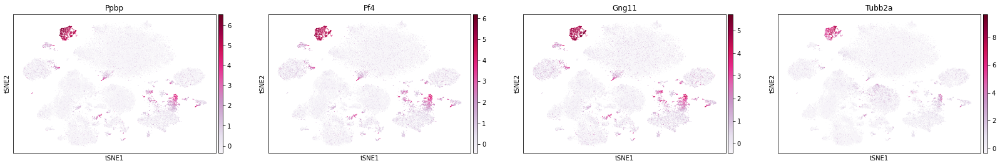

Neutrophil
--------------------------------------------------------------------------------------------------------------------


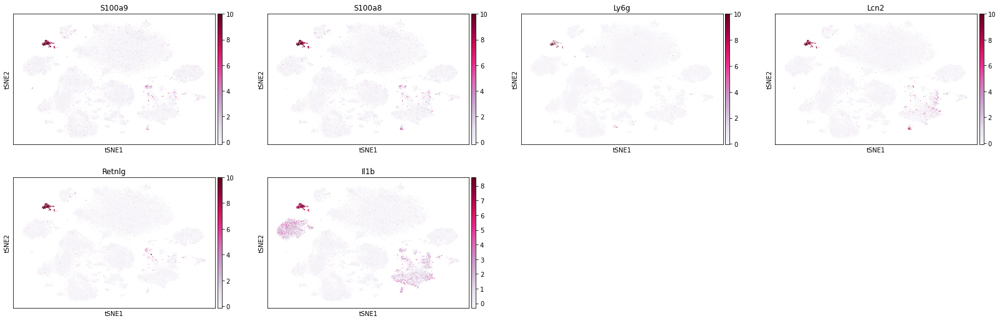

T cell (Lef1 high)
--------------------------------------------------------------------------------------------------------------------


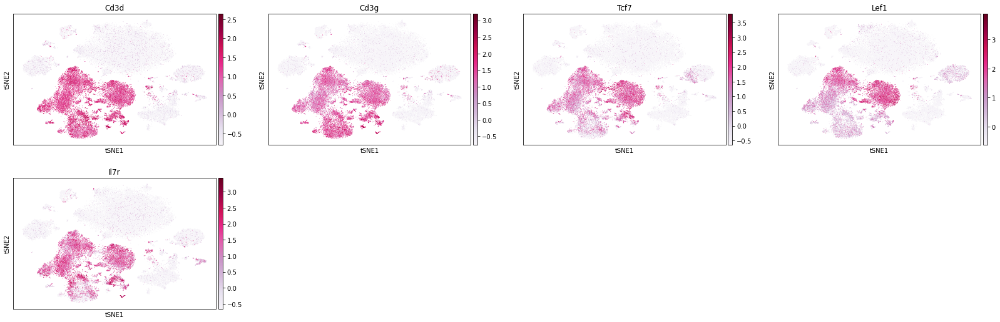

Basophil (Ccl3 High)
--------------------------------------------------------------------------------------------------------------------


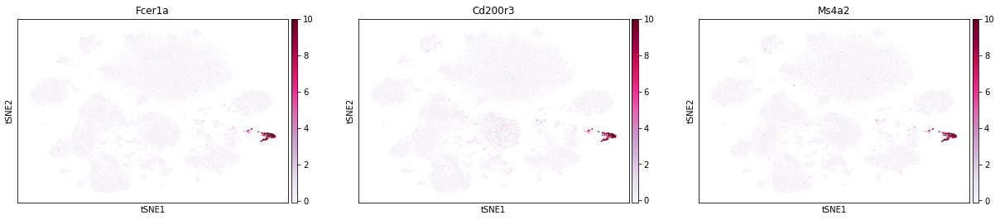

Macrophage (Ifitm3 High)
--------------------------------------------------------------------------------------------------------------------


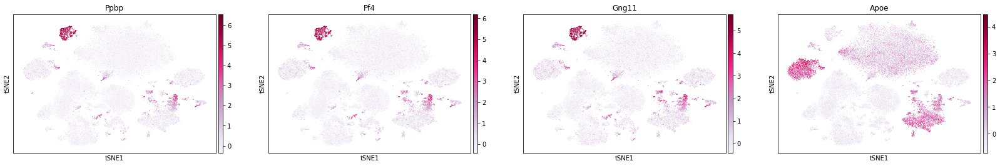

T cell (Stmn1 High)
--------------------------------------------------------------------------------------------------------------------


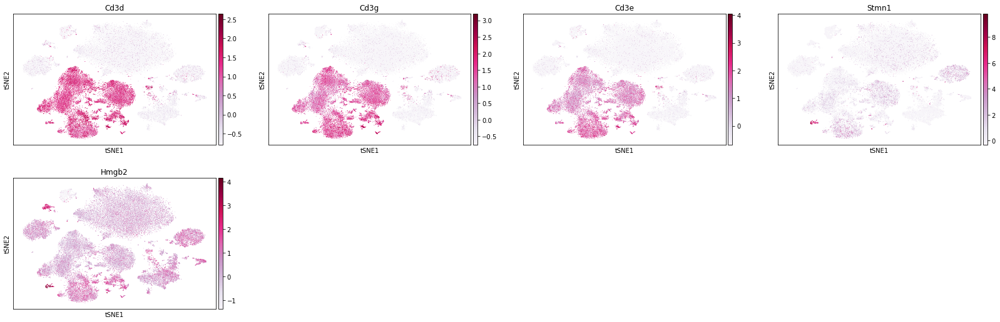

T cell (Ifit3 High)
--------------------------------------------------------------------------------------------------------------------


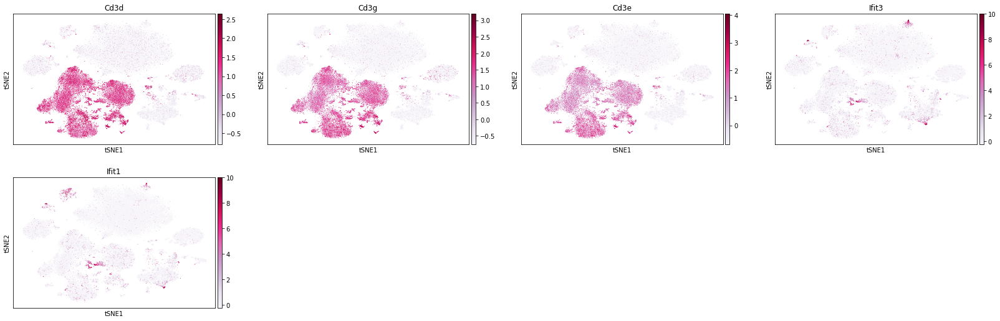

B cell (H2-Ab1 High)
--------------------------------------------------------------------------------------------------------------------


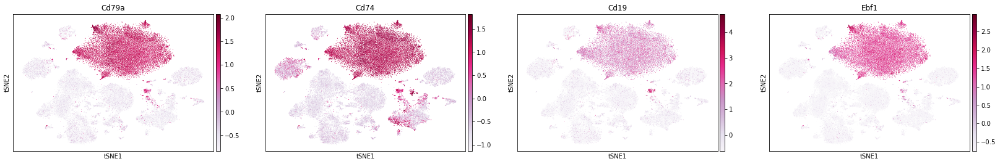

Dendritic cell
--------------------------------------------------------------------------------------------------------------------


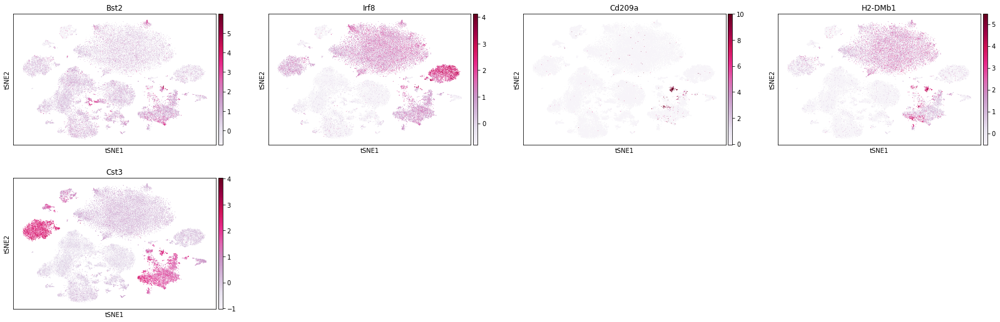

Monocyte (Ifi204 High)
--------------------------------------------------------------------------------------------------------------------


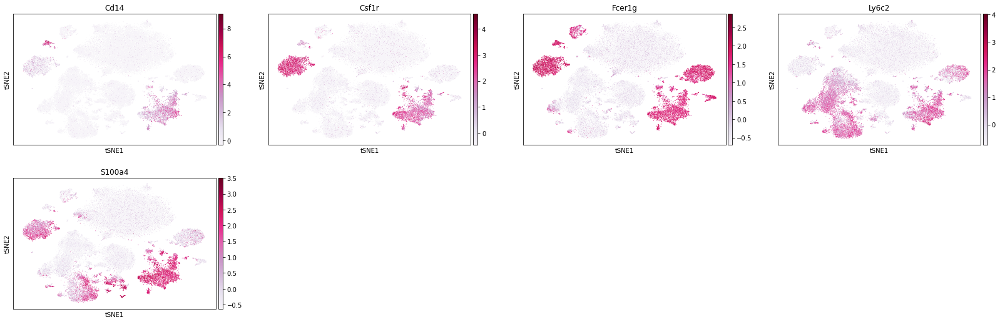

Macrophage (Ace high)
--------------------------------------------------------------------------------------------------------------------


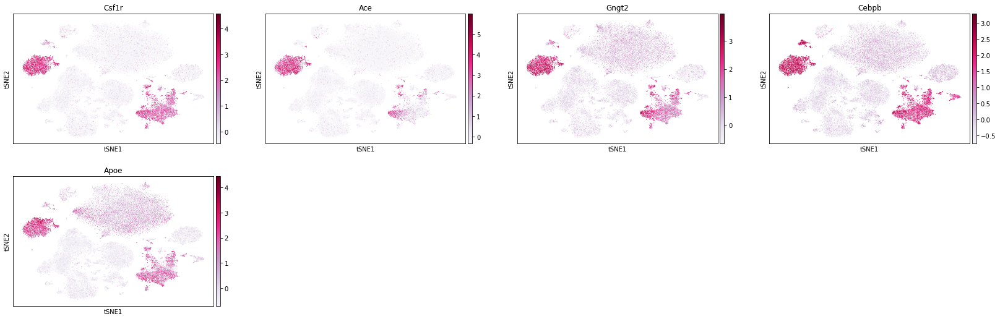

NK cell (Ncr1 High)
--------------------------------------------------------------------------------------------------------------------


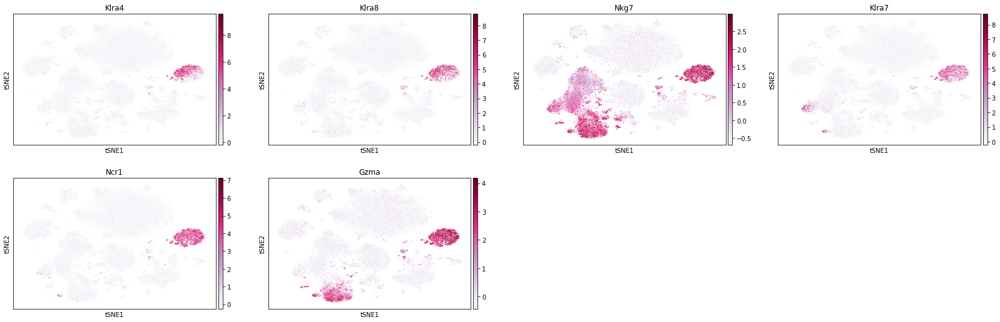

B cell (Ebf1 High)
--------------------------------------------------------------------------------------------------------------------


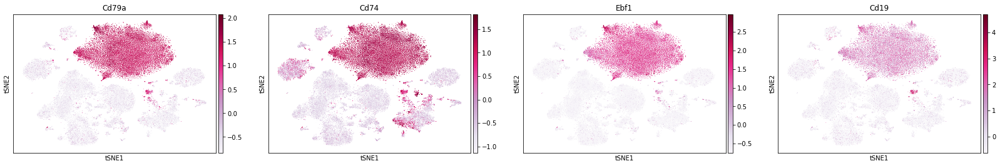

In [25]:
from matplotlib import pyplot as plt
from IPython import display
%matplotlib inline
resolutions=[0.2,0.4,0.6,0.8,1.0,1.2]
for res in resolutions:
    print('resolutions==',res)
    sc.tl.leiden(adata,resolution=res,key_added='leiden'+str(res))
    
    
sc.pl.tsne(adata,color=['leiden0.2','leiden0.4','leiden0.6','leiden0.8','leiden1.0','leiden1.2'])

for i,g in enumerate(marker_dict_s):
    print(cell_list_s[i])
    print('--------------------------------------------------------------------------------------------------------------------')
    gy=[]
    for gene in g:
        if gene in adata.var.index:
            gy.append(gene)
    sc.pl.tsne(adata,color=gy,cmap='PuRd')


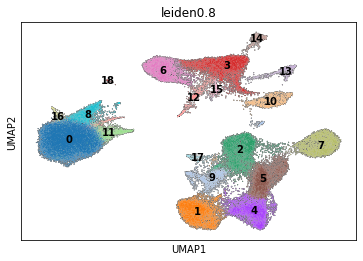

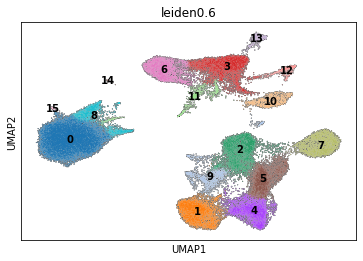

In [36]:
sc.pl.umap(adata,color=['leiden0.8'],legend_loc='on data',add_outline=True)
sc.pl.umap(adata,color=['leiden0.6'],legend_loc='on data',add_outline=True)


In [26]:
marker=[]
for m in marker_dict_s:
    marker+=m

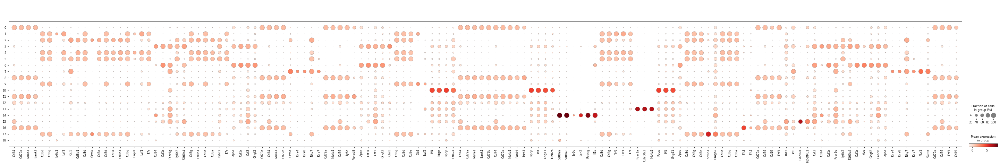

In [27]:
sc.pl.dotplot(adata, marker, groupby='leiden0.8')

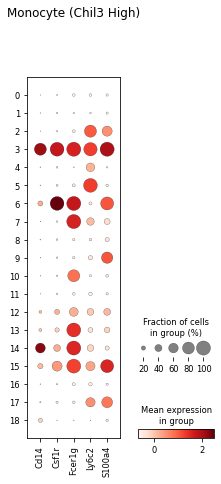

c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


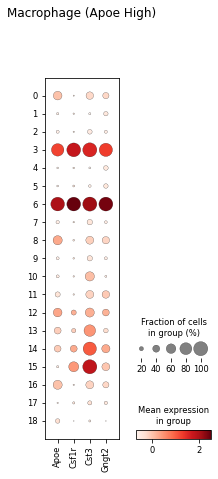

c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


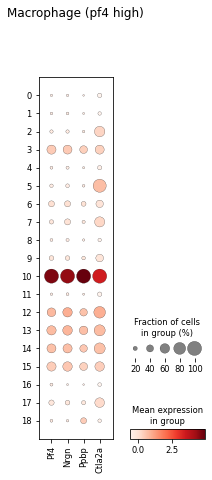

c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


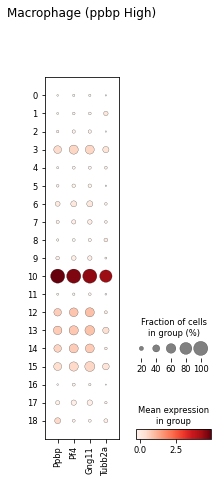

c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


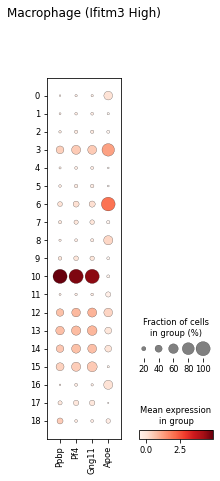

c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


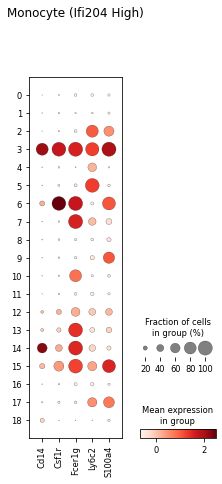

c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


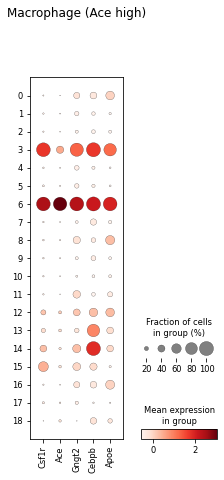

In [34]:
for i,m in enumerate(marker_dict_s):
    if   i in [4,6,12,15,19,24,25]:
        cell = cell_list_s[i]
        sc.pl.dotplot(adata, m, groupby='leiden0.8',title=cell)

In [37]:
cluster2annotation = {
     '0': 'B cell-1',
     '1': 'T cell-3',
     '2': 'T cell-4',
     '3': 'Monocyte-1',
     '4': 'T cell-1',
     '5': 'T cell-1' ,
     '6': 'Monocyte-2',
     '7': 'NK cell',
     '8': 'B cell-2',
     '9': 'T cell-2',
     '10': 'Macrophage-1',
     '11': 'B cell-2',
     '12':'Macrophage-2',
    '13':'Basophil',
    '14':'Neutrophil',
    '15':'Dendritic cell',
    '16':'B cell-3',
    '17':'T cell-2',
    '18':'Other'

}
adata.obs['cell type']=adata.obs['leiden0.8'].map(cluster2annotation).astype('category')

In [38]:

for i in adata.obs['cell type'].value_counts().index:
    print(i)
    foo = adata[adata.obs['cell type']==str(i),:]
    print(foo.obs['sample'].value_counts())

B cell-1
Tg_9m_4     2134
Tg_3m_3     1787
Tg_12m_3    1517
Tg_2m_4     1487
Tg_3m_4     1435
Tg_12m_1    1199
Tg_12m_4    1098
Tg_3m_1     1005
Tg_9m_1      923
Tg_3m_2      912
Tg_9m_3      910
Tg_2m_2      824
Tg_2m_1      653
Tg_2m_3      627
Tg_9m_2      621
Tg_12m_2     511
Name: sample, dtype: int64
T cell-1
Tg_2m_4     792
Tg_2m_2     784
Tg_12m_1    769
Tg_12m_4    699
Tg_12m_3    690
Tg_9m_1     655
Tg_9m_2     645
Tg_12m_2    633
Tg_9m_4     603
Tg_2m_1     582
Tg_3m_4     541
Tg_2m_3     531
Tg_9m_3     522
Tg_3m_1     466
Tg_3m_2     464
Tg_3m_3     385
Name: sample, dtype: int64
T cell-3
Tg_2m_4     551
Tg_2m_3     514
Tg_2m_2     501
Tg_2m_1     458
Tg_9m_4     456
Tg_9m_1     445
Tg_9m_2     333
Tg_12m_1    321
Tg_9m_3     308
Tg_12m_3    305
Tg_3m_3     291
Tg_3m_1     291
Tg_3m_4     255
Tg_3m_2     251
Tg_12m_4    243
Tg_12m_2    159
Name: sample, dtype: int64
T cell-4
Tg_9m_4     662
Tg_9m_3     590
Tg_9m_2     467
Tg_3m_4     462
Tg_2m_3     422
Tg_12m_4    387
Tg_

c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


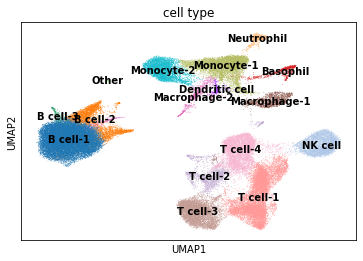

In [40]:
sc.pl.umap(adata,color=['cell type'],legend_loc='on data')

In [41]:
adata.write('Result\\ann_all_bbknn_8_26.h5ad')

c:\users\pc\appdata\local\programs\python\python38\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


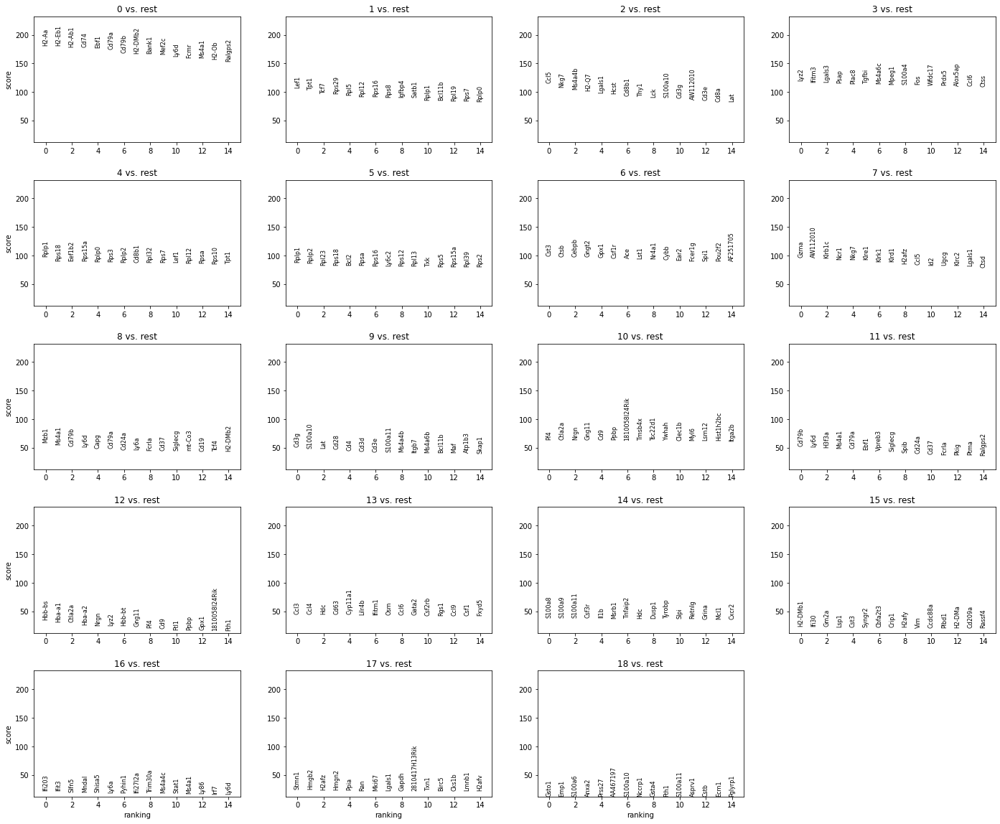

In [32]:
sc.tl.rank_genes_groups(adata,'leiden0.8',method='wilcoxon')
sc.pl.rank_genes_groups(adata,n_genes=15)